In [1]:
# Install Essential Libraries
!pip install ultralytics

   ---------------------------------------- 0.0/901.7 kB ? eta -:--:--
   ----------- ---------------------------- 262.1/901.7 kB ? eta -:--:--
   ----------------------- ---------------- 524.3/901.7 kB 1.7 MB/s eta 0:00:01
   ---------------------------------------- 901.7/901.7 kB 1.6 MB/s eta 0:00:00
   ---------------------------------------- 0.0/203.1 MB ? eta -:--:--
   ---------------------------------------- 0.3/203.1 MB ? eta -:--:--
   ---------------------------------------- 0.3/203.1 MB ? eta -:--:--
   ---------------------------------------- 0.5/203.1 MB 882.6 kB/s eta 0:03:50
   ---------------------------------------- 0.5/203.1 MB 882.6 kB/s eta 0:03:50
   ---------------------------------------- 0.8/203.1 MB 762.0 kB/s eta 0:04:26
   ---------------------------------------- 1.0/203.1 MB 774.0 kB/s eta 0:04:22
   ---------------------------------------- 1.3/203.1 MB 932.1 kB/s eta 0:03:37
   ---------------------------------------- 1.6/203.1 MB 911.5 kB/s eta 0:03:42
   

In [2]:
# Import Essential Libraries
import os
import random
import pandas as pd
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video
import numpy as np  
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')

Creating new Ultralytics Settings v0.0.6 file  
View Ultralytics Settings with 'yolo settings' or at 'C:\Users\RIDHO\AppData\Roaming\Ultralytics\settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
model = YOLO("yolo11n.pt")

100%|██████████| 5.35M/5.35M [00:03<00:00, 1.48MB/s]


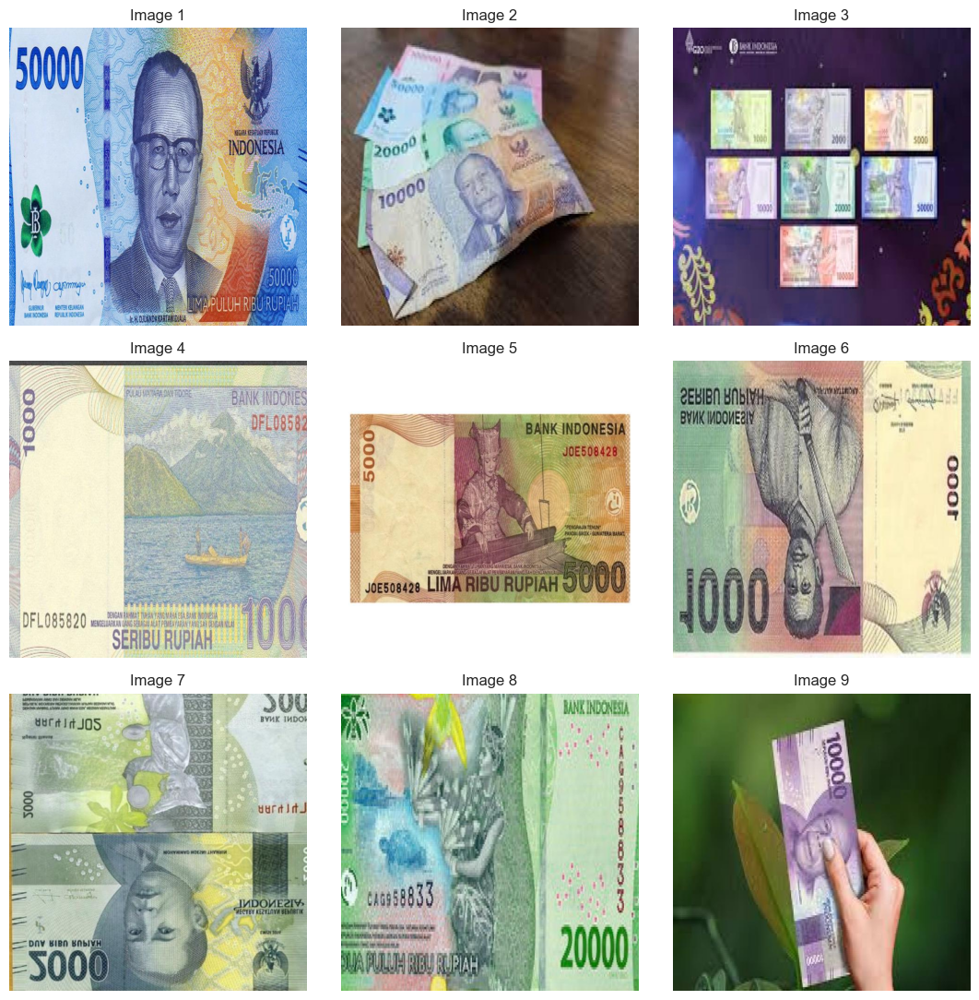

In [ ]:
# Update the image directory path
Image_dir = r'C:\Users\RIDHO\Documents\Visual Code\Deteksi Rupiah\Rupiah\train\images'

num_samples = 9
image_files = os.listdir(Image_dir)

# Randomly select num_samples images
rand_images = random.sample(image_files, num_samples)

fig, axes = plt.subplots(3, 3, figsize=(11, 11))

for i in range(num_samples):
    image = rand_images[i]
    ax = axes[i // 3, i % 3]
    ax.imshow(plt.imread(os.path.join(Image_dir, image)))
    ax.set_title(f'Image {i+1}')
    ax.axis('off')

plt.tight_layout()
plt.show()

In [5]:
# Get the size of the image
# Update the image path
image_path = r'C:\Users\RIDHO\Documents\Visual Code\Deteksi Rupiah\Rupiah\train\images\100-000-1-_jpg.rf.36962f573bddb78060fe9991a75857a8.jpg'

# Get the size of the image
image = cv2.imread(image_path)

# Check if the image was loaded successfully
if image is not None:
    h, w, c = image.shape
    print(f"The image has dimensions {w}x{h} and {c} channels.")
else:
    print("Error: Image not found or unable to load.")

The image has dimensions 640x640 and 3 channels.



0: 640x640 (no detections), 134.4ms
Speed: 15.6ms preprocess, 134.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


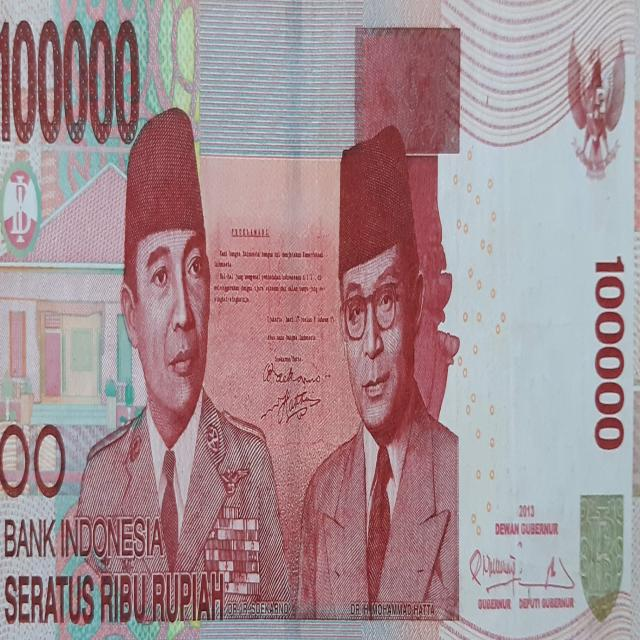

In [6]:
# Use a pretrained YOLOv8n model
model = YOLO("yolo11n.pt")

# Update the image path
image_path = r'C:\Users\RIDHO\Documents\Visual Code\Deteksi Rupiah\Rupiah\train\images\100-000-1-_jpg.rf.36962f573bddb78060fe9991a75857a8.jpg'

# Get the size of the image
image = cv2.imread(image_path)

result_predict = model.predict(source = image, imgsz=(640))

# show results
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))

In [7]:
# Build from YAML and transfer weights
Final_model = YOLO('yolo11n.pt')

# Training The Final Model
Result_Final_model = Final_model.train(data=r"C:\Users\RIDHO\Documents\Visual Code\Deteksi Rupiah\Rupiah\data.yaml", epochs=20, batch=-1, optimizer='auto')

Ultralytics 8.3.52  Python-3.11.0 torch-2.5.1+cpu CPU (Intel Core(TM) i5-4690 3.50GHz)
engine\trainer: task=detect, mode=train, model=yolo11n.pt, data=C:\Users\RIDHO\Documents\Visual Code\Deteksi Rupiah\Rupiah\data.yaml, epochs=20, time=None, patience=100, batch=-1, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=Fals

100%|██████████| 755k/755k [00:00<00:00, 2.12MB/s]


Overriding model.yaml nc=80 with nc=7

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

train: Scanning C:\Users\RIDHO\Documents\Visual Code\Deteksi Rupiah\Rupiah\train\labels... 693 images, 3 backgrounds, 0 corrupt: 100%|██████████| 693/693 [00:02<00:00, 231.24it/s]


train: New cache created: C:\Users\RIDHO\Documents\Visual Code\Deteksi Rupiah\Rupiah\train\labels.cache
WARNING  Box and segment counts should be equal, but got len(segments) = 678, len(boxes) = 1308. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
AutoBatch: Computing optimal batch size for imgsz=640 at 60.0% CUDA memory utilization.
AutoBatch:   intended for CUDA devices, using default batch-size 16


train: Scanning C:\Users\RIDHO\Documents\Visual Code\Deteksi Rupiah\Rupiah\train\labels.cache... 693 images, 3 backgrounds, 0 corrupt: 100%|██████████| 693/693 [00:00<?, ?it/s]

WARNING  Box and segment counts should be equal, but got len(segments) = 678, len(boxes) = 1308. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.



val: Scanning C:\Users\RIDHO\Documents\Visual Code\Deteksi Rupiah\Rupiah\valid\labels... 66 images, 0 backgrounds, 0 corrupt: 100%|██████████| 66/66 [00:00<00:00, 231.96it/s]


val: New cache created: C:\Users\RIDHO\Documents\Visual Code\Deteksi Rupiah\Rupiah\valid\labels.cache
WARNING  Box and segment counts should be equal, but got len(segments) = 56, len(boxes) = 111. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
Plotting labels to runs\detect\train\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000909, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20         0G     0.6968      3.352      1.266         14        640: 100%|██████████| 44/44 [04:46<00:00,  6.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:10<00:00,  3.36s/it]

                   all         66        111     0.0131      0.808      0.221      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20         0G     0.6384      2.787      1.221         21        640: 100%|██████████| 44/44 [04:44<00:00,  6.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:10<00:00,  3.40s/it]

                   all         66        111      0.325      0.207      0.292      0.173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20         0G     0.6886      2.288      1.248         32        640: 100%|██████████| 44/44 [04:52<00:00,  6.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:10<00:00,  3.34s/it]

                   all         66        111      0.439      0.516      0.446      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20         0G     0.6213      1.903      1.189         16        640: 100%|██████████| 44/44 [04:42<00:00,  6.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:09<00:00,  3.24s/it]

                   all         66        111      0.347      0.472      0.357       0.26



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20         0G      0.595      1.715      1.159         30        640: 100%|██████████| 44/44 [04:42<00:00,  6.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:09<00:00,  3.33s/it]

                   all         66        111      0.596      0.569      0.633      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20         0G     0.5832      1.578      1.148         20        640: 100%|██████████| 44/44 [04:41<00:00,  6.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:09<00:00,  3.29s/it]

                   all         66        111      0.585      0.506      0.596      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20         0G     0.5332      1.478      1.111         17        640: 100%|██████████| 44/44 [04:42<00:00,  6.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:09<00:00,  3.22s/it]

                   all         66        111      0.789      0.567      0.714       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20         0G     0.5413       1.34       1.12         21        640: 100%|██████████| 44/44 [04:42<00:00,  6.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:09<00:00,  3.28s/it]

                   all         66        111      0.673      0.612      0.693      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20         0G     0.4838      1.232      1.081         16        640: 100%|██████████| 44/44 [04:42<00:00,  6.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:09<00:00,  3.24s/it]

                   all         66        111      0.751      0.658      0.751      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20         0G     0.5028       1.17      1.098         22        640: 100%|██████████| 44/44 [04:44<00:00,  6.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:09<00:00,  3.21s/it]

                   all         66        111      0.729      0.759      0.765      0.686


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20         0G     0.5469      1.581      1.191          8        640: 100%|██████████| 44/44 [04:41<00:00,  6.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:09<00:00,  3.31s/it]

                   all         66        111      0.754      0.727      0.772      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20         0G     0.4784       1.25      1.129          9        640: 100%|██████████| 44/44 [04:42<00:00,  6.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:10<00:00,  3.36s/it]

                   all         66        111       0.85      0.612      0.744      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20         0G      0.438        1.1      1.079          7        640: 100%|██████████| 44/44 [04:41<00:00,  6.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:09<00:00,  3.30s/it]

                   all         66        111      0.882      0.672      0.778       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20         0G     0.4205      1.049      1.074          9        640: 100%|██████████| 44/44 [04:38<00:00,  6.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:09<00:00,  3.31s/it]

                   all         66        111      0.865      0.722      0.782      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20         0G     0.3759     0.9692      1.046         10        640: 100%|██████████| 44/44 [04:38<00:00,  6.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:09<00:00,  3.29s/it]

                   all         66        111      0.846       0.74      0.782      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20         0G     0.3847     0.8769      1.048          8        640: 100%|██████████| 44/44 [04:39<00:00,  6.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:09<00:00,  3.25s/it]

                   all         66        111      0.869      0.725      0.793      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20         0G     0.3539     0.8172      1.023         14        640: 100%|██████████| 44/44 [04:39<00:00,  6.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:10<00:00,  3.34s/it]

                   all         66        111      0.869      0.796      0.833      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20         0G     0.3579     0.8081      1.037          5        640: 100%|██████████| 44/44 [04:40<00:00,  6.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:09<00:00,  3.29s/it]

                   all         66        111      0.873      0.746      0.815      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20         0G     0.3252     0.7482      1.004          6        640: 100%|██████████| 44/44 [05:02<00:00,  6.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:09<00:00,  3.27s/it]

                   all         66        111      0.929      0.773      0.836      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20         0G     0.3311     0.7272      1.009          7        640: 100%|██████████| 44/44 [04:40<00:00,  6.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:09<00:00,  3.27s/it]

                   all         66        111      0.863      0.795      0.827      0.774



20 epochs completed in 1.634 hours.
Optimizer stripped from runs\detect\train\weights\last.pt, 5.5MB
Optimizer stripped from runs\detect\train\weights\best.pt, 5.5MB

Validating runs\detect\train\weights\best.pt...
Ultralytics 8.3.52  Python-3.11.0 torch-2.5.1+cpu CPU (Intel Core(TM) i5-4690 3.50GHz)
YOLO11n summary (fused): 238 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.86s/it]


                   all         66        111      0.929      0.773      0.836      0.789
 dua puluh ribu rupiah         12         18          1      0.467      0.599      0.484
       dua ribu rupiah         16         20          1       0.91      0.945       0.94
lima puluh ribu rupiah         11         18      0.819      0.833      0.881      0.788
      lima ribu rupiah          7          9      0.818      0.778      0.761      0.761
   sepuluh ribu rupiah         10         11          1      0.705      0.804      0.769
   seratus ribu rupiah         13         20      0.864        0.8      0.927      0.857
         seribu rupiah         12         15          1      0.921      0.936      0.924
Speed: 2.4ms preprocess, 109.8ms inference, 0.0ms loss, 7.4ms postprocess per image
Results saved to runs\detect\train


In [8]:
# Configure the visual appearance of Seaborn plots
sns.set(rc={'axes.facecolor': '#eae8fa'}, style='darkgrid')

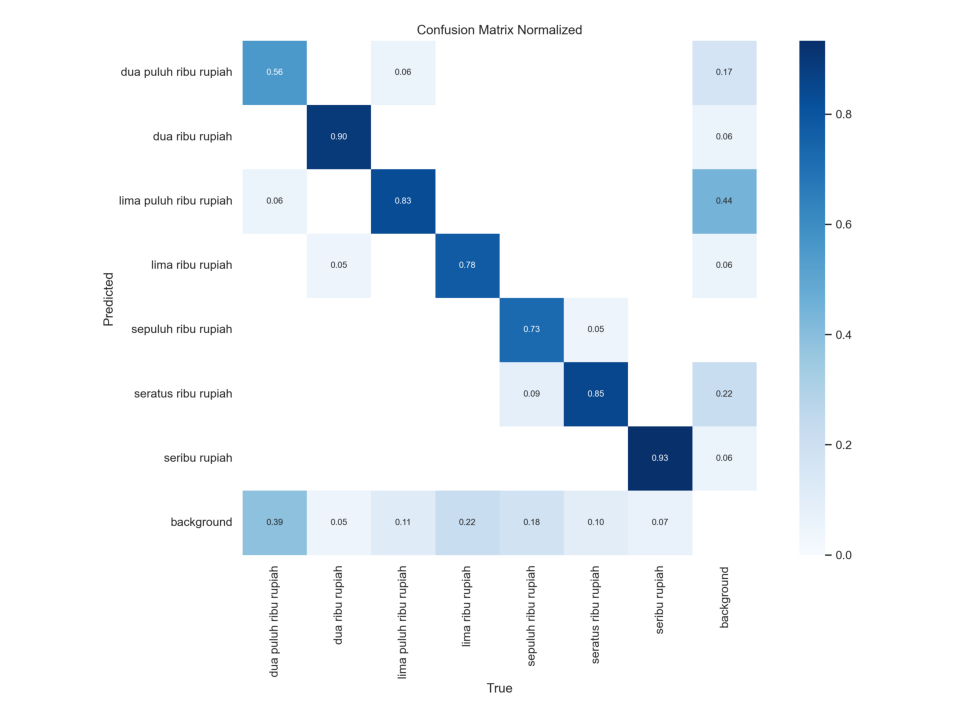

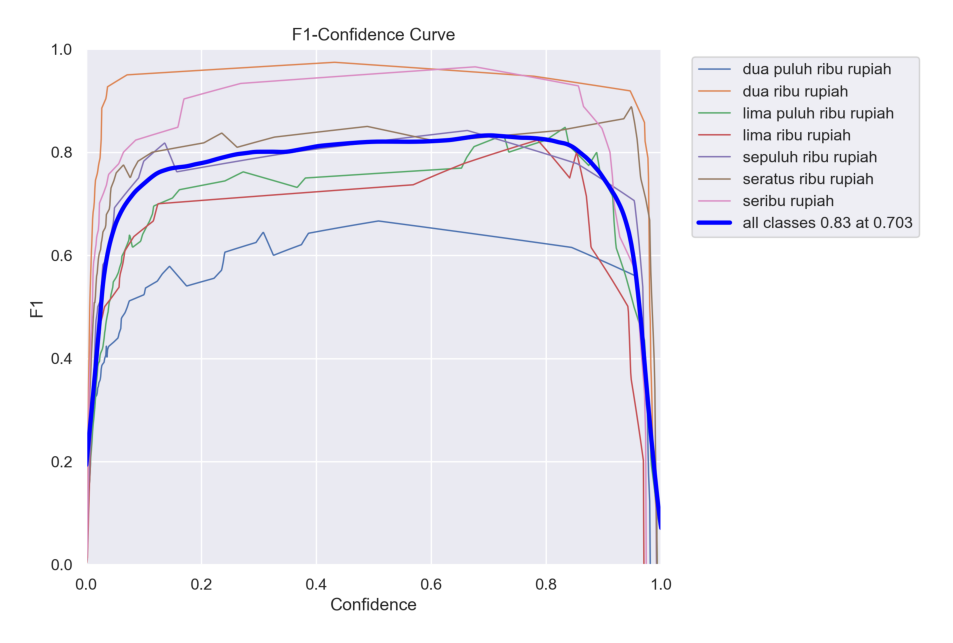

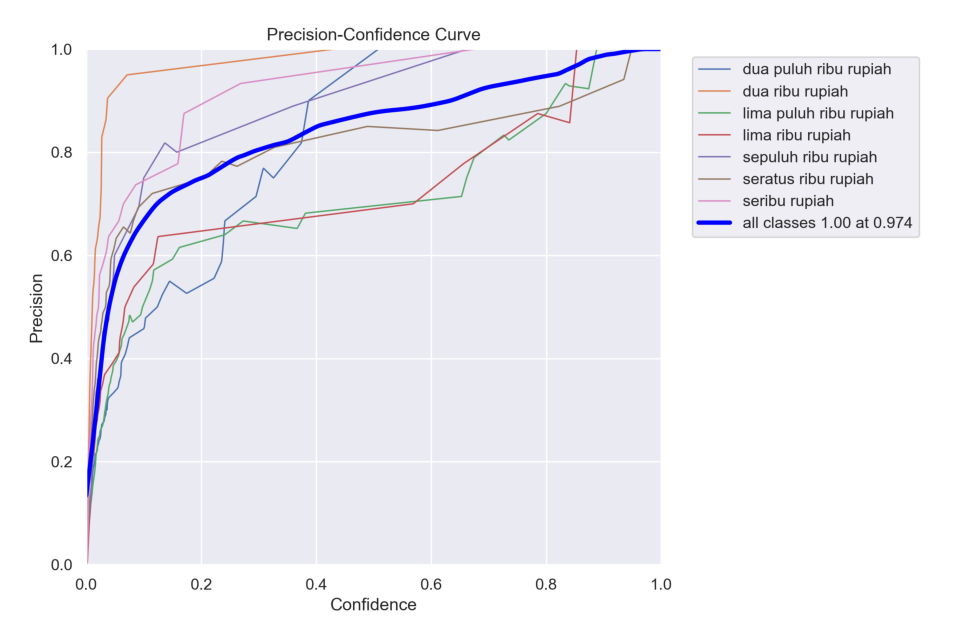

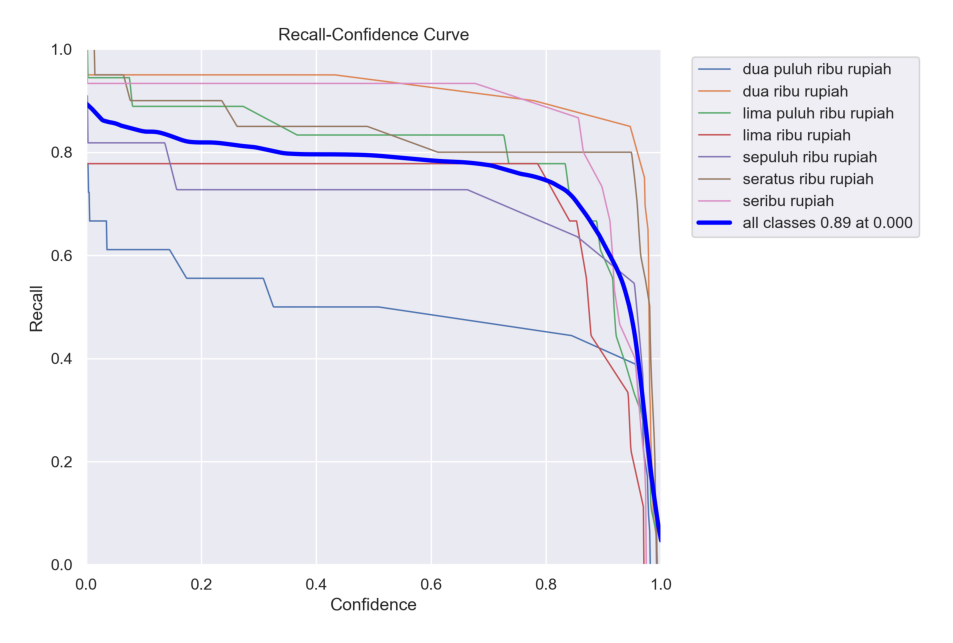

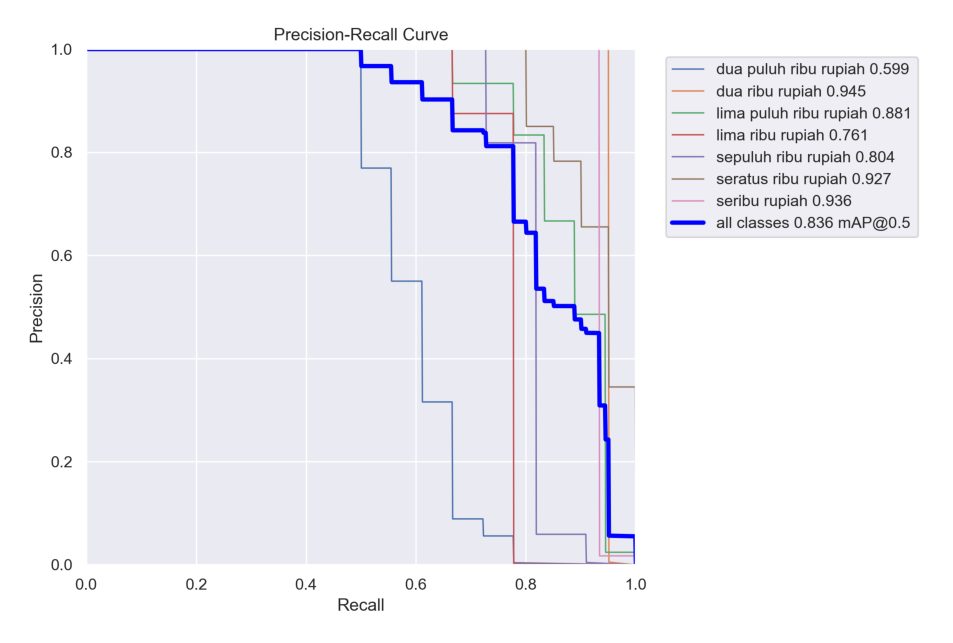

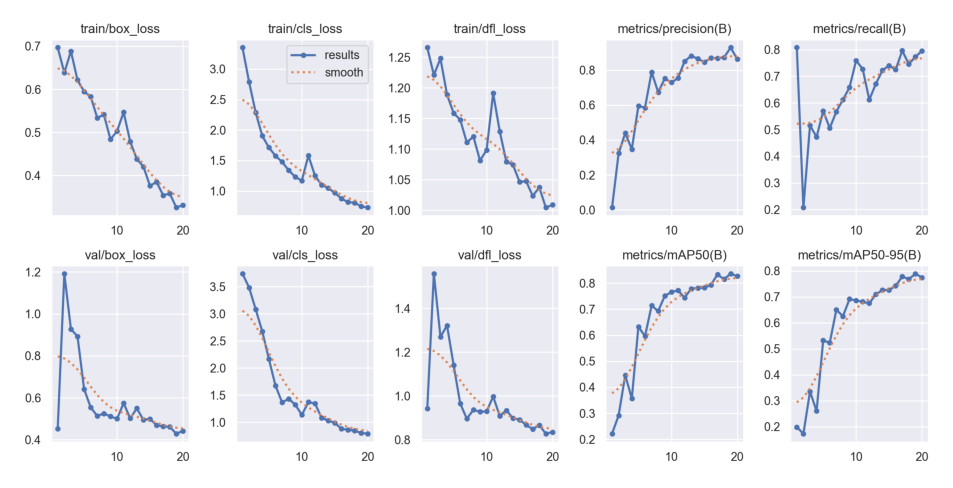

In [11]:
import os
import cv2
import matplotlib.pyplot as plt

def display_images(post_training_files_path, image_files):

    for image_file in image_files:
        image_path = os.path.join(post_training_files_path, image_file)
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(10, 10), dpi=120)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

# List of image files to display
image_files = [
    'confusion_matrix_normalized.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png',
    'results.png'
]

# Path to the directory containing the images
post_training_files_path = 'runs/detect/train'

# Display the images
display_images(post_training_files_path, image_files)

In [12]:
Result_Final_model = pd.read_csv('runs/detect/train/results.csv')
Result_Final_model.tail(10)

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
10,11,3244.60,0.54687,1.58148,1.19102,0.75369,0.72691,0.77227,0.68107,0.57430,1.37124,0.99670,0.000459,0.000459,0.000459
11,12,3537.25,0.47840,1.24985,1.12879,0.84952,0.61200,0.74428,0.67478,0.50182,1.34759,0.90845,0.000414,0.000414,0.000414
12,13,3828.68,0.43805,1.10004,1.07914,0.88157,0.67196,0.77816,0.70964,0.54982,1.08204,0.93391,0.000369,0.000369,0.000369
13,14,4117.19,0.42049,1.04892,1.07450,0.86510,0.72216,0.78167,0.72584,0.49492,1.03236,0.89814,0.000324,0.000324,0.000324
14,15,4406.38,0.37590,0.96923,1.04626,0.84635,0.74038,0.78191,0.72601,0.49941,0.99060,0.89129,0.000279,0.000279,0.000279
15,16,4696.57,0.38474,0.87685,1.04751,0.86874,0.72489,0.79318,0.74216,0.46894,0.88057,0.86693,0.000234,0.000234,0.000234
16,17,4986.43,0.35387,0.81718,1.02346,0.86855,0.79613,0.83306,0.77804,0.46367,0.86164,0.84826,0.000189,0.000189,0.000189
17,18,5277.53,0.35793,0.80813,1.03719,0.87288,0.74552,0.81545,0.76782,0.46117,0.84552,0.86615,0.000144,0.000144,0.000144
18,19,5590.78,0.32520,0.74822,1.00426,0.92865,0.77345,0.83621,0.78898,0.42854,0.80461,0.82695,0.000099,0.000099,0.000099
19,20,5881.69,0.33109,0.72719,1.00899,0.86274,0.79490,0.82670,0.77399,0.44215,0.78933,0.83480,0.000054,0.000054,0.000054


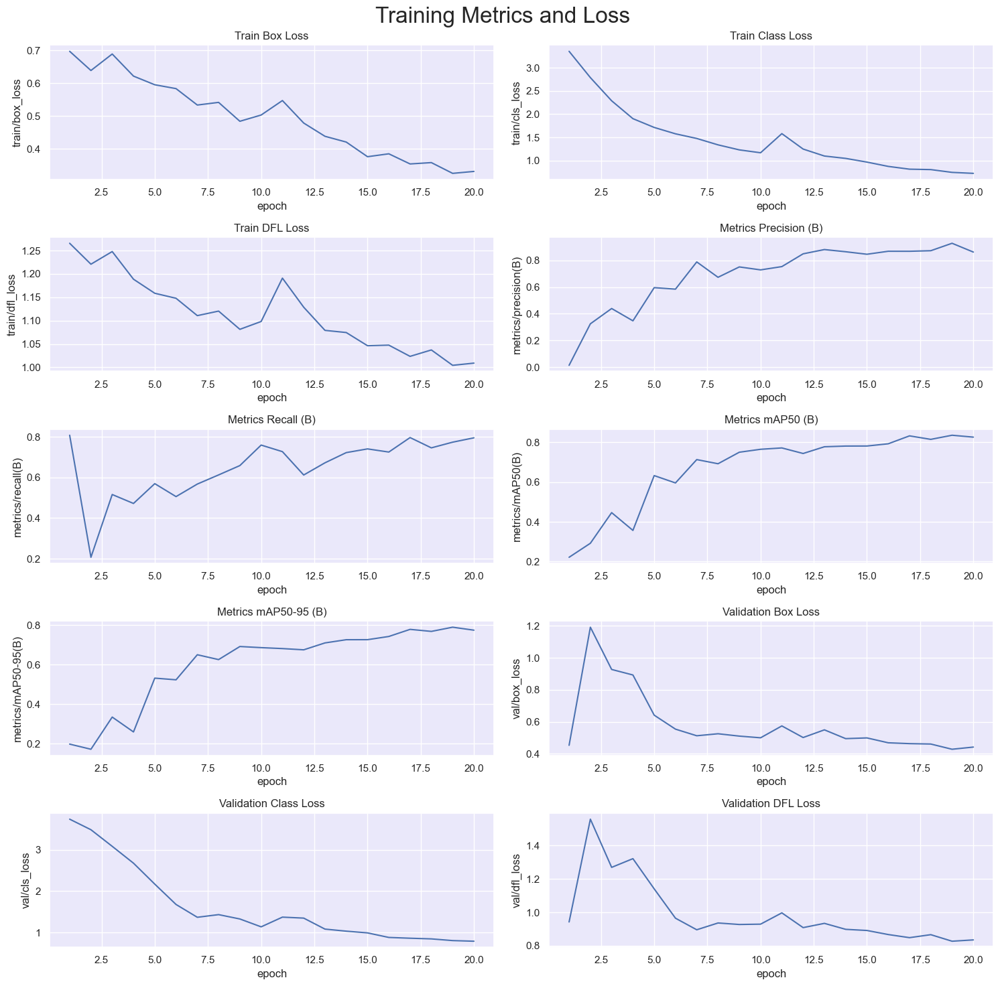

In [13]:
# Read the results.csv file as a pandas dataframe
Result_Final_model.columns = Result_Final_model.columns.str.strip()

# Create subplots
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# Plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=Result_Final_model, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=Result_Final_model, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=Result_Final_model, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=Result_Final_model, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=Result_Final_model, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=Result_Final_model, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=Result_Final_model, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=Result_Final_model, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=Result_Final_model, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=Result_Final_model, ax=axs[4,1])

# Set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')


plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.8)
plt.tight_layout()
plt.show()

In [9]:
# Loading the best performing model
Valid_model = YOLO(r'C:\Users\wahyu\Downloads\Deteksi Rupiah\runs\detect\train\weights\best.pt')

In [15]:
# Evaluating the model on the validset
metrics = Valid_model.val(split = 'val')

# final results
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

Ultralytics 8.3.52  Python-3.11.0 torch-2.5.1+cpu CPU (Intel Core(TM) i5-4690 3.50GHz)
YOLO11n summary (fused): 238 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs


val: Scanning C:\Users\RIDHO\Documents\Visual Code\Deteksi Rupiah\Rupiah\valid\labels.cache... 66 images, 0 backgrounds, 0 corrupt: 100%|██████████| 66/66 [00:00<?, ?it/s]

WARNING  Box and segment counts should be equal, but got len(segments) = 56, len(boxes) = 111. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:09<00:00,  1.84s/it]


                   all         66        111      0.929      0.773      0.836      0.789
 dua puluh ribu rupiah         12         18          1      0.467      0.599      0.484
       dua ribu rupiah         16         20          1       0.91      0.945       0.94
lima puluh ribu rupiah         11         18      0.819      0.833      0.881      0.788
      lima ribu rupiah          7          9      0.818      0.778      0.761      0.761
   sepuluh ribu rupiah         10         11          1      0.705      0.804      0.769
   seratus ribu rupiah         13         20      0.864        0.8      0.927      0.857
         seribu rupiah         12         15          1      0.921      0.936      0.924
Speed: 2.6ms preprocess, 114.5ms inference, 0.0ms loss, 7.2ms postprocess per image
Results saved to runs\detect\val
precision(B):  0.9287619978013041
metrics/recall(B):  0.7733803795817977
metrics/mAP50(B):  0.8361996235974454
metrics/mAP50-95(B):  0.7891966128500439



0: 640x640 1 seratus ribu rupiah, 168.6ms
Speed: 16.1ms preprocess, 168.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 seratus ribu rupiahs, 97.8ms
Speed: 4.4ms preprocess, 97.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 seribu rupiah, 102.4ms
Speed: 7.7ms preprocess, 102.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 dua ribu rupiah, 91.2ms
Speed: 3.0ms preprocess, 91.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 dua ribu rupiah, 136.0ms
Speed: 0.0ms preprocess, 136.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 dua puluh ribu rupiah, 1 seribu rupiah, 115.0ms
Speed: 0.0ms preprocess, 115.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 dua puluh ribu rupiahs, 119.9ms
Speed: 13.7ms preprocess, 119.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 64

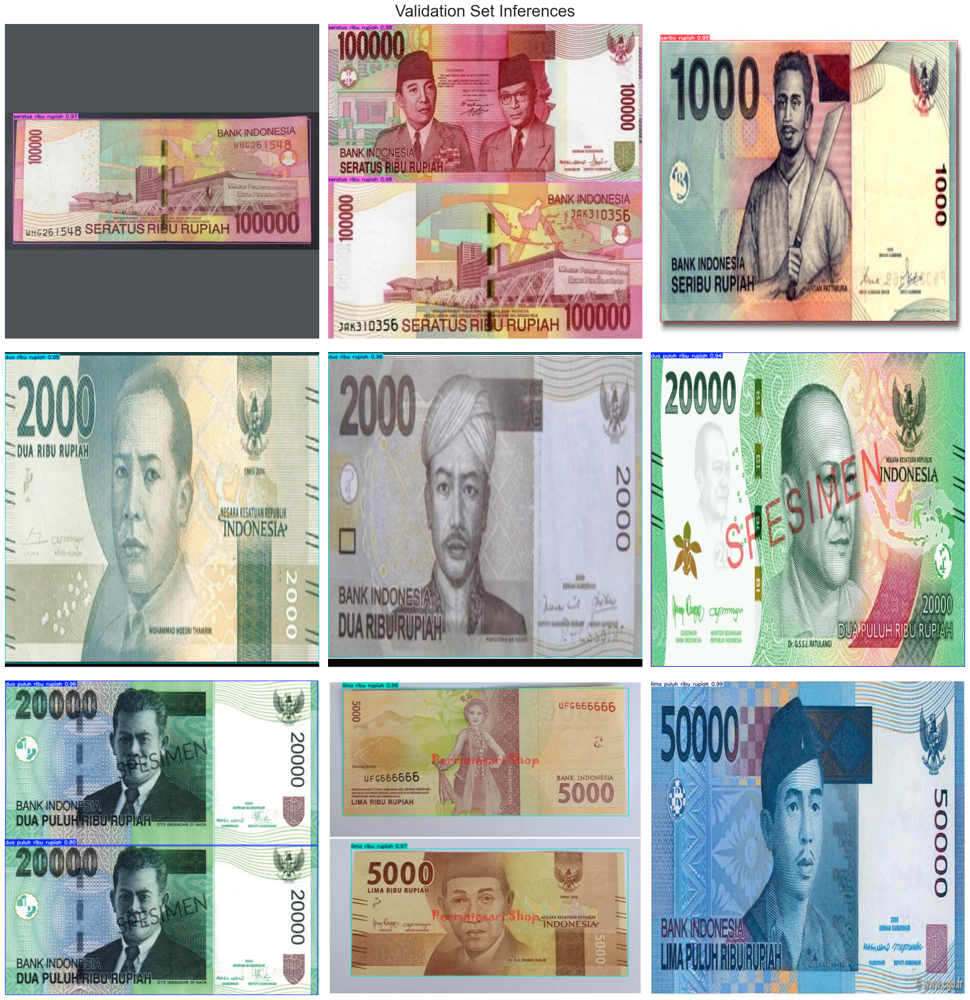

In [16]:
# Normalization function
def normalize_image(image):
    return image / 255.0

# Image resizing function
def resize_image(image, size=(640, 640)):
    return cv2.resize(image, size)

# Path to validation images
dataset_path = r'C:\Users\RIDHO\Documents\Visual Code\Deteksi Rupiah\Rupiah'  # Place your dataset path here
valid_images_path = os.path.join(dataset_path, 'test', 'images')

# List of all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Check if there are images in the directory
if len(image_files) > 0:
    # Select 9 images at equal intervals
    num_images = len(image_files)
    step_size = max(1, num_images // 9)  # Ensure the interval is at least 1
    selected_images = [image_files[i] for i in range(0, num_images, step_size)]

    # Prepare subplots
    fig, axes = plt.subplots(3, 3, figsize=(20, 21))
    fig.suptitle('Validation Set Inferences', fontsize=24)

    for i, ax in enumerate(axes.flatten()):
        if i < len(selected_images):
            image_path = os.path.join(valid_images_path, selected_images[i])

            # Load image
            image = cv2.imread(image_path)

            # Check if the image is loaded correctly
            if image is not None:
                # Resize image
                resized_image = resize_image(image, size=(640, 640))
                # Normalize image
                normalized_image = normalize_image(resized_image)

                # Convert the normalized image to uint8 data type
                normalized_image_uint8 = (normalized_image * 255).astype(np.uint8)

                # Predict with the model
                results = Valid_model.predict(source=normalized_image_uint8, imgsz=640, conf=0.5)

                # Plot image with labels
                annotated_image = results[0].plot(line_width=1)
                annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
                ax.imshow(annotated_image_rgb)
            else:
                print(f"Failed to load image {image_path}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()

In [10]:
results = Valid_model("Video1.mp4", save=True, save_txt=False, save_conf=False)



WARNING  inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/1524) c:\Users\wahyu\Downloads\Deteksi Rupiah\Video1.mp4: 384x640 4 dua puluh ribu rupiahs, 2 dua ribu rupiahs, 2 lima ribu rupiahs, 1 sepuluh ribu rupiah, 2 seribu rupiahs, 85.6ms
video 1/1 (frame 2/1524) c:\Users\wahyu\Downloads\Deteksi Rupiah\Video1.mp4: 384x640 4 dua puluh ribu rupiahs, 2 dua ribu rupiahs, 2 lima ribu rupiahs, 1 sepuluh ribu rupiah, 2 seribu rupiahs, 74.7ms
video 1/1 (frame 3/1524) c:\Users\wahyu\Downloads\Deteksi 